## Sources/Bibliography:

  * #### Aurélien Géron, Hands-On Machine learning with Scikit-Learn and TensorFlow. 2022. https://www.oreilly.com/library/view/hands-on-machine-learning/9781098125967/

  * #### An Introduction to Virtual Environments in Python (https://medium.com/@dakota.lillie/an-introduction-to-virtual-environments-in-python-ce16cda92853)
    * #### pip install numpy pandas seaborn matplotlib geopandas contextily

  * #### ALTERNATIVE: Setting up Miniconda on Ubuntu (https://medium.com/featurepreneur/setting-up-miniconda-on-ubuntu-4bf6bece6f9b)
    * #### conda install -c conda-forge numpy pandas seaborn matplotlib geopandas contextily

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
from matplotlib import pyplot as plt
# import matplotlib.pyplot as plt
# plt.style.use('dark_background')

## Read Dataset
#### Name: "California Housing Prices" (https://www.kaggle.com/camnugent/california-housing-prices)

In [2]:
data = pd.read_csv('./data/housing.csv')

## Getting familliar with the Data (i.e., Pandas 101)

In [3]:
data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [4]:
# Size and Structure of Data
*data.shape,\
data.columns

(20640,
 10,
 Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
        'total_bedrooms', 'population', 'households', 'median_income',
        'median_house_value', 'ocean_proximity'],
       dtype='object'))

In [5]:
data.head(1)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY


In [6]:
data.tail(1)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


## Baseline Statistics

In [7]:
data.loc[:, ['ocean_proximity']]

,ocean_proximity
0,NEAR BAY
1,NEAR BAY
2,NEAR BAY
3,NEAR BAY
4,NEAR BAY
...,...
20635,INLAND
20636,INLAND
20637,INLAND
20638,INLAND


In [8]:
# data[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']].describe()
data.describe().round(2).loc[:, 'housing_median_age':]

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.00,20640.00,20433.00,20640.00,20640.00,20640.00,20640.00
mean,28.64,2635.76,537.87,1425.48,499.54,3.87,206855.82
std,12.59,2181.62,421.39,1132.46,382.33,1.90,115395.62
min,1.00,2.00,1.00,3.00,1.00,0.50,14999.00
25%,18.00,1447.75,296.00,787.00,280.00,2.56,119600.00
50%,29.00,2127.00,435.00,1166.00,409.00,3.53,179700.00
75%,37.00,3148.00,647.00,1725.00,605.00,4.74,264725.00
max,52.00,39320.00,6445.00,35682.00,6082.00,15.00,500001.00


In [9]:
data.ocean_proximity.describe()

count         20640
unique            5
top       <1H OCEAN
freq           9136
Name: ocean_proximity, dtype: object

In [10]:
# More Quantiles
data.quantile([.1, .3, 1/3, .5, .7])

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0.100000,-122.29,33.63,13.0,941.000000,198.0,510.0,184.0,1.903800,82300.0
0.300000,-121.37,34.00,20.0,1578.000000,322.0,859.0,305.0,2.740100,134000.0
0.333333,-121.19,34.04,22.0,1666.666667,341.0,908.0,322.0,2.891967,141400.0
0.500000,-118.49,34.26,29.0,2127.000000,435.0,1166.0,409.0,3.534800,179700.0
0.700000,-118.13,37.48,36.0,2876.000000,591.0,1580.0,553.0,4.437500,241930.0


## Visualizations
  * ### Missing Values per Feature

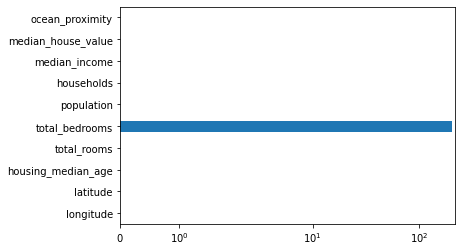

In [11]:
fig, ax = plt.subplots(1, 1)
data.isna().sum().plot.barh(ax=ax)

ax.set_xscale('symlog')

  * ### Features' Histogram

Text(0, 0.5, '#Houses')

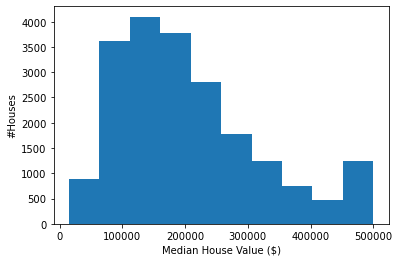

In [12]:
fig, ax = plt.subplots(1,1)

data.median_house_value.plot.hist(bins=10, alpha=1, ax=ax)
ax.set_xlabel('Median House Value ($)')
ax.set_ylabel('#Houses')

  * ### Features' Density

Text(0, 0.5, '#Houses')

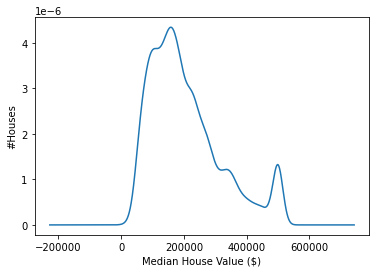

In [13]:
fig, ax = plt.subplots(1,1)

data.median_house_value.plot.density(ax=ax)
ax.set_xlabel('Median House Value ($)')
ax.set_ylabel('#Houses')

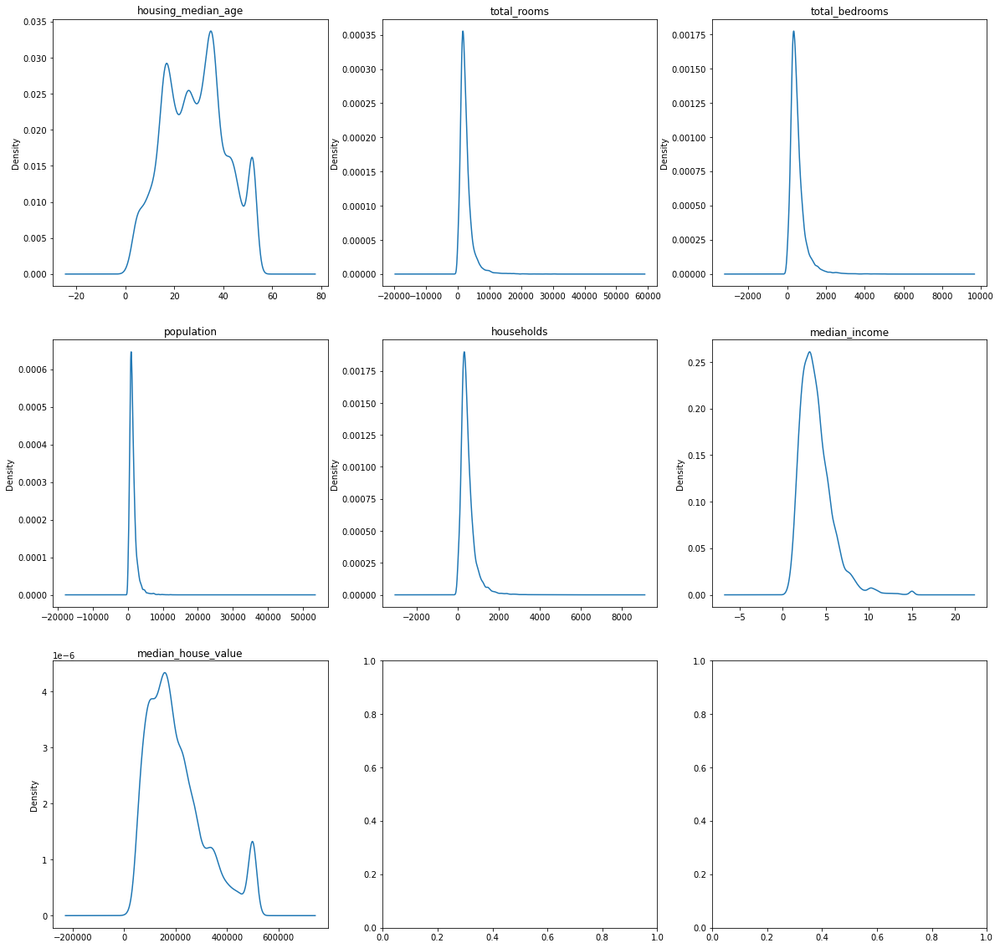

In [14]:
# "Classic" method
numeric_feats = ['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']

fig, ax = plt.subplots(3,3, figsize=(20,20))
i, j = 0, 0

for idx, feat in enumerate(numeric_feats):
    data[feat].plot.density(ax=ax[i, j])
    ax[i, j].set_title(feat)

    if (idx + 1) % 3 == 0:
        i += 1
        j = 0
    else:
        j += 1

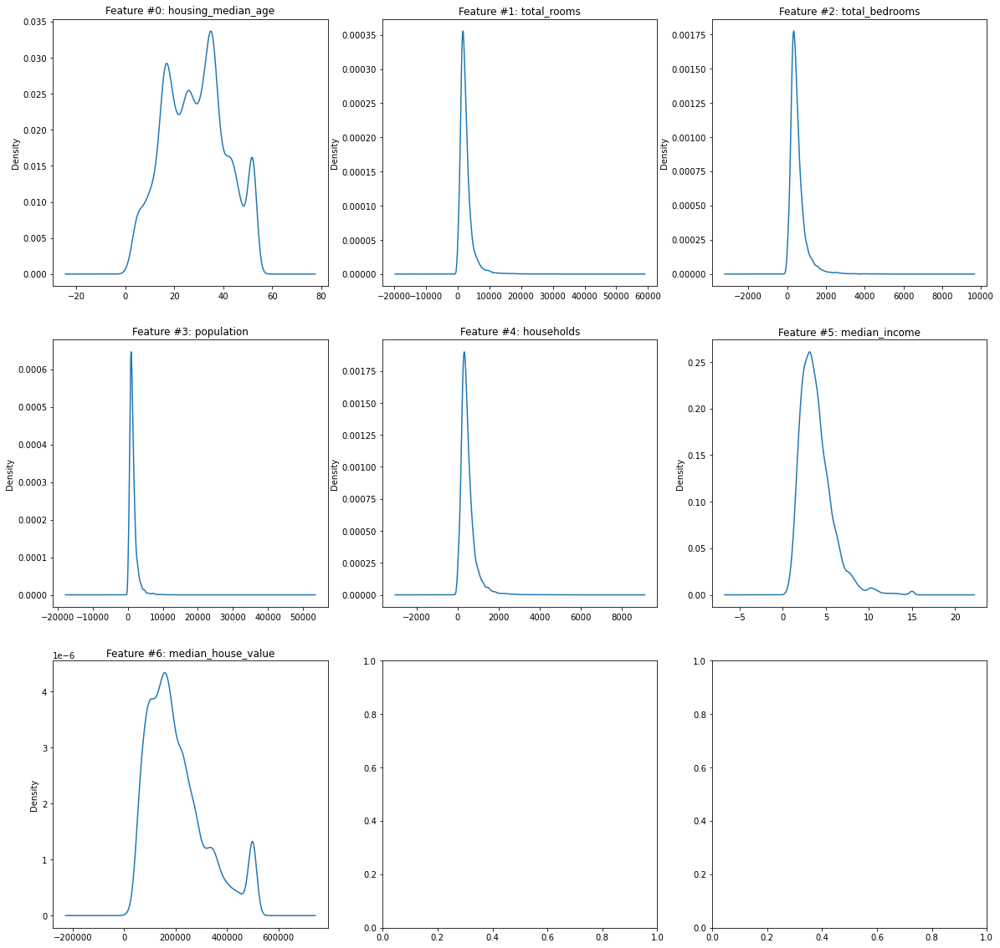

In [15]:
# "Pythonic" method
numeric_feats = ['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']

fig, ax = plt.subplots(3,3, figsize=(20,20))

for idx, (ax_i, feat) in enumerate(zip(ax.flatten(), numeric_feats)):

    data[feat].plot.density(ax=ax_i)
    ax_i.set_title(f'Feature #{idx}: {feat}')

  * ### Features' Pie Chart

In [16]:
data.ocean_proximity.unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [17]:
data.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [18]:
pd.Categorical(
    values=data.ocean_proximity,
    categories=['ISLAND', 'NEAR OCEAN', 'NEAR BAY', '<1H OCEAN', 'INLAND'],
).value_counts()

ISLAND           5
NEAR OCEAN    2658
NEAR BAY      2290
<1H OCEAN     9136
INLAND        6551
dtype: int64

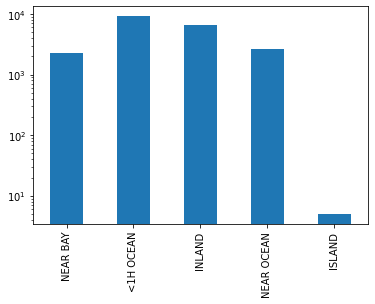

In [19]:
ax = data.ocean_proximity.value_counts(sort=False).plot.bar()
ax.set_yscale('log')

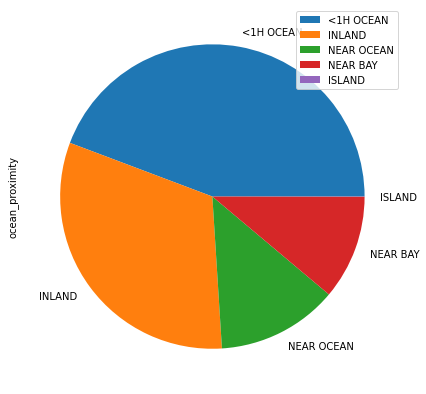

In [20]:
out = data.ocean_proximity.value_counts(sort=True, normalize=True)

fig, ax = plt.subplots(1,1, figsize=(7,7))
out.plot.pie(legend=True, ax=ax)
plt.show()

  * ### Visualize Dataset (w.r.t space)

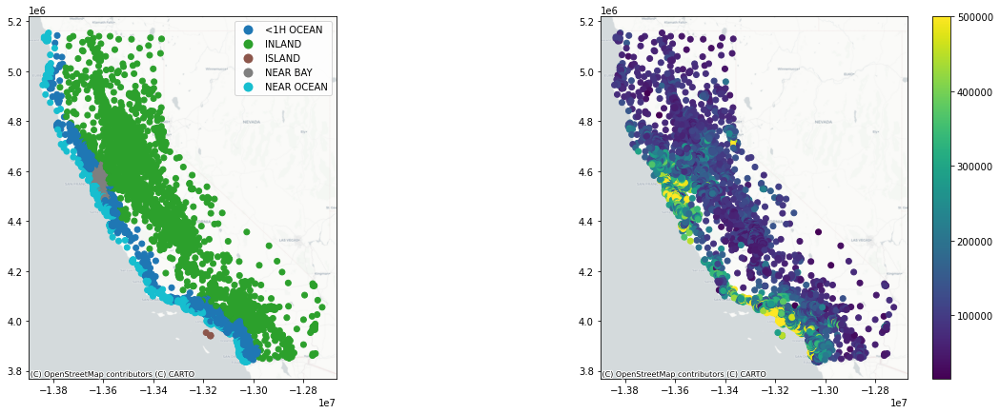

In [21]:
import geopandas as gpd 
import contextily as ctx

data_geom = gpd.GeoDataFrame(data, crs='epsg:4326', geometry=gpd.points_from_xy(data['longitude'], data['latitude']))

fig, ax = plt.subplots(1, 2, figsize=(20, 7))

# PLOT #1
data_geom.to_crs(epsg=3857).plot(ax=ax[0], column='ocean_proximity', legend=True)
ctx.add_basemap(ax=ax[0], source=ctx.providers.CartoDB.Positron)

# PLOT #2
data_geom.to_crs(epsg=3857).plot(ax=ax[1], column='median_house_value', cmap='viridis', legend=True)
ctx.add_basemap(ax=ax[1], source=ctx.providers.CartoDB.Positron)

plt.savefig('data.png', dpi=300)
plt.show()

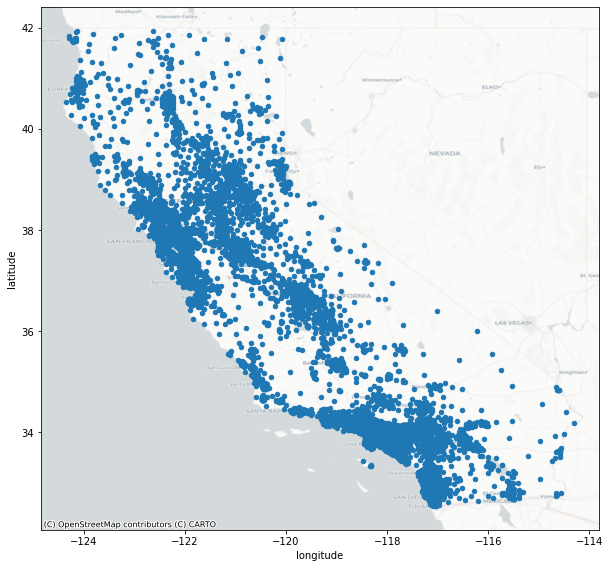

In [22]:
fig, ax = plt.subplots(1,1, figsize=(10, 10))
data.plot.scatter(x='longitude', y='latitude', ax=ax)
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron, crs=4326)

In [23]:
data_geom.explore(column='median_house_value')

## Correlation/Covariance

In [24]:
data.corr(method='pearson')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


<AxesSubplot:>

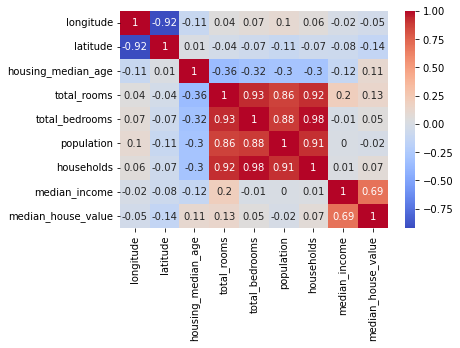

In [25]:
sns.heatmap(data.corr().round(2), cmap='coolwarm', annot=True)

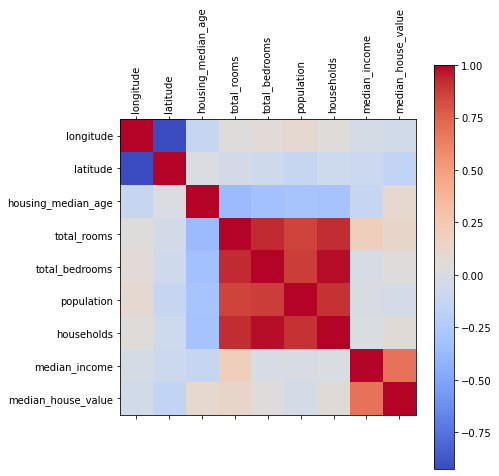

In [26]:
fig, ax = plt.subplots(1,1, figsize=(7,7))
sm = ax.matshow(data.corr(), cmap='coolwarm')

plt.xticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, rotation=90, ha='center')
plt.yticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, )

plt.colorbar(sm)

plt.tight_layout()
plt.savefig('corrmap.png', dpi=300)
plt.show()

In [27]:
data.cov()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,4.014139,-3.957054,-2.728244,1.948037e+02,5.876851e+01,2.263778e+02,4.236807e+01,-0.057765,-1.062743e+04
latitude,-3.957054,4.562293,0.300346,-1.682178e+02,-6.029962e+01,-2.631378e+02,-5.801024e+01,-0.323860,-3.553256e+04
housing_median_age,-2.728244,0.300346,158.396260,-9.919120e+03,-1.700313e+03,-4.222271e+03,-1.457581e+03,-2.846140,1.533988e+05
total_rooms,194.803750,-168.217847,-9919.120060,4.759445e+06,8.567306e+05,2.117613e+06,7.661046e+05,820.852410,3.377289e+07
total_bedrooms,58.768508,-60.299623,-1700.312817,8.567306e+05,1.775654e+05,4.191391e+05,1.578295e+05,-6.180851,2.416878e+06
population,226.377839,-263.137814,-4222.270582,2.117613e+06,4.191391e+05,1.282470e+06,3.928036e+05,10.400979,-3.221249e+06
households,42.368072,-58.010245,-1457.581290,7.661046e+05,1.578295e+05,3.928036e+05,1.461760e+05,9.466667,2.904924e+06
median_income,-0.057765,-0.323860,-2.846140,8.208524e+02,-6.180851e+00,1.040098e+01,9.466667e+00,3.609323,1.508475e+05
median_house_value,-10627.425205,-35532.559074,153398.801329,3.377289e+07,2.416878e+06,-3.221249e+06,2.904924e+06,150847.482793,1.331615e+10


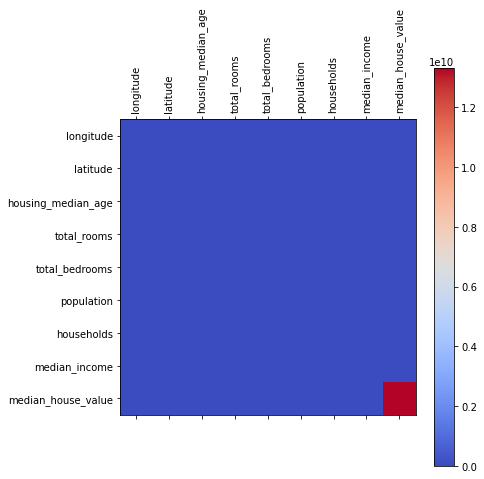

In [28]:
fig, ax = plt.subplots(1,1, figsize=(7,7))
sm = ax.matshow(data.cov(), cmap='coolwarm')

plt.xticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, rotation=90, ha='center')
plt.yticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, )

plt.colorbar(sm)

plt.tight_layout()
plt.savefig('covmap.png', dpi=300)
plt.show()

### The plots display seemingly "conflicted" conclusions (why?)

#### Covariance is an indicator of the extent to which 2 random variables are dependent on each other. A higher number denotes higher dependency. Correlation is a statistical measure that indicates how strongly two variables are related.
#### Covariance vs. Correlation: Differences to Know - Built In, https://builtin.com/data-science/covariance-vs-correlation
#### More info on correlation @ https://towardsdatascience.com/statistics-in-python-using-chi-square-for-feature-selection-d44f467ca745 

## Scatter Plot

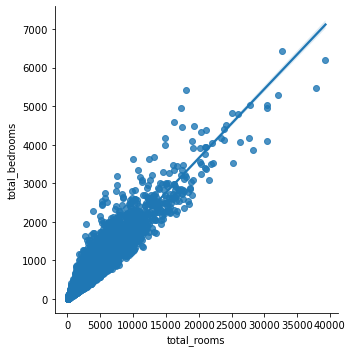

In [29]:
sns.lmplot(x="total_rooms", y="total_bedrooms", data=data, )

<AxesSubplot:xlabel='housing_median_age', ylabel='latitude'>

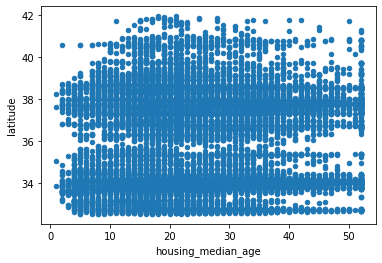

In [30]:
data.plot.scatter(x='housing_median_age', y='latitude')

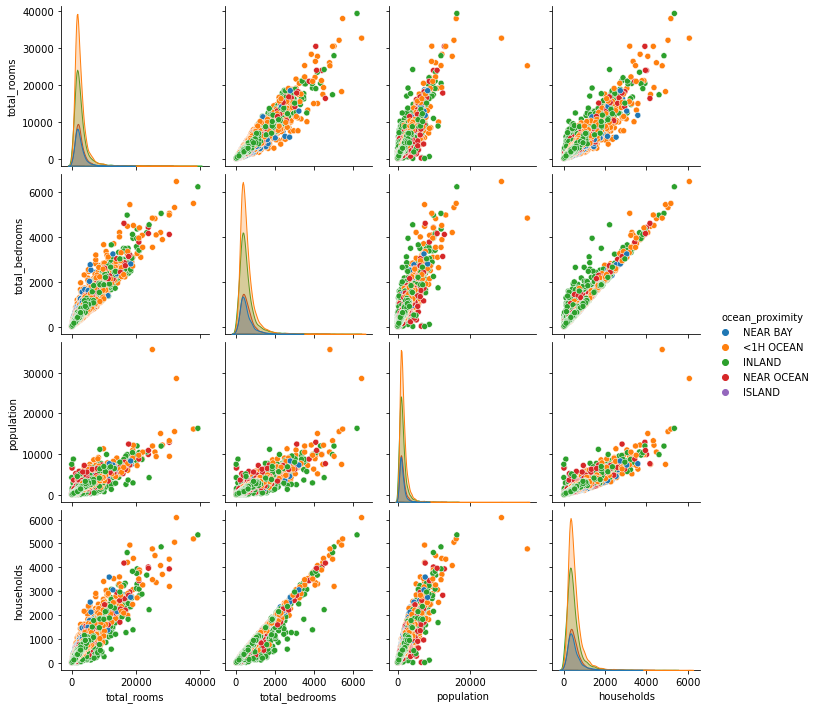

In [31]:
sns.pairplot(data=data[['total_rooms', 'total_bedrooms', 'population', 'households', 'ocean_proximity']], hue="ocean_proximity")

## Data Preprocessing

In [32]:
# Missing Values per Column
data.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [33]:
data.loc[data.total_bedrooms.isna()].ocean_proximity.value_counts()

<1H OCEAN     102
INLAND         55
NEAR OCEAN     30
NEAR BAY       20
Name: ocean_proximity, dtype: int64

In [34]:
data.total_bedrooms.mean().round()

538.0

In [ ]:
# The simple option - but not the best
# data.loc[data.total_bedrooms.isna(), 'total_bedrooms'] = data.total_bedrooms.mean()

In [35]:
data.groupby('ocean_proximity').apply(
    lambda l: l.total_bedrooms.mean()
).astype(int)

ocean_proximity
<1H OCEAN     546
INLAND        533
ISLAND        420
NEAR BAY      514
NEAR OCEAN    538
dtype: int64

In [36]:
# Fill NaN values  --  USE the AVERAGE per "class" (e.g., ocean_proximity)
total_bedrooms_op = data.groupby('ocean_proximity').apply(
    lambda l: l.total_bedrooms.mean()
).astype(int)
print(total_bedrooms_op)

ocean_proximity
<1H OCEAN     546
INLAND        533
ISLAND        420
NEAR BAY      514
NEAR OCEAN    538
dtype: int64


In [37]:
data.loc[:, 'total_bedrooms_mean'] = data.groupby('ocean_proximity', group_keys=False).apply(lambda l: l.total_bedrooms.fillna(total_bedrooms_op[l.name]))

In [38]:
# Fill NaN values  --  USE the MEDIAN per "class" (e.g. ocean_proximity)
total_bedrooms_op = data.groupby('ocean_proximity').apply(lambda l: l.total_bedrooms.median())
print(total_bedrooms_op)
data.loc[:, 'total_bedrooms_median'] = data.groupby('ocean_proximity', group_keys=False).apply(lambda l: l.total_bedrooms.fillna(total_bedrooms_op[l.name]))

ocean_proximity
<1H OCEAN     438.0
INLAND        423.0
ISLAND        512.0
NEAR BAY      423.0
NEAR OCEAN    464.0
dtype: float64


In [39]:
# AVERAGE / MEDIAN per 'ocean_proximity' can be deceiving, lets use the houses' price. BUT its a numeric feature --> DISCRETIZATION
data.loc[:, 'median_house_value_range'] = pd.cut(data.median_house_value, bins=15)
# data.median_house_value_range.value_counts(sort=False)

# Fill NaN values  --  USE the MEDIAN per "houses' price range"
total_bedrooms_op = data.groupby('median_house_value_range').apply(lambda l: l.total_bedrooms.median()).astype(int)
print(total_bedrooms_op)
data.loc[:, 'total_bedrooms_median_prange'] = data.groupby('median_house_value_range', group_keys=False).apply(lambda l: l.total_bedrooms.fillna(total_bedrooms_op[l.name]))

median_house_value_range
(14513.998, 47332.467]      324
(47332.467, 79665.933]      376
(79665.933, 111999.4]       406
(111999.4, 144332.867]      453
(144332.867, 176666.333]    430
(176666.333, 208999.8]      447
(208999.8, 241333.267]      463
(241333.267, 273666.733]    474
(273666.733, 306000.2]      478
(306000.2, 338333.667]      448
(338333.667, 370667.133]    449
(370667.133, 403000.6]      461
(403000.6, 435334.067]      472
(435334.067, 467667.533]    471
(467667.533, 500001.0]      407
dtype: int64


In [40]:
data.loc[data.total_bedrooms.isna()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_mean,total_bedrooms_median,median_house_value_range,total_bedrooms_median_prange
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,161900.0,NEAR BAY,514.0,423.0,"(144332.867, 176666.333]",430.0
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,85100.0,NEAR BAY,514.0,423.0,"(79665.933, 111999.4]",406.0
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,173400.0,NEAR BAY,514.0,423.0,"(144332.867, 176666.333]",430.0
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,247100.0,NEAR BAY,514.0,423.0,"(241333.267, 273666.733]",474.0
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,178400.0,NEAR BAY,514.0,423.0,"(176666.333, 208999.8]",447.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,220500.0,NEAR OCEAN,538.0,464.0,"(208999.8, 241333.267]",463.0
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,167400.0,NEAR OCEAN,538.0,464.0,"(144332.867, 176666.333]",430.0
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,410700.0,<1H OCEAN,546.0,438.0,"(403000.6, 435334.067]",472.0
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,258100.0,<1H OCEAN,546.0,438.0,"(241333.267, 273666.733]",474.0


In [41]:
# ALTERNATIVE - Infer it using another correlated feature (e.g. households, total_rooms)
# This approach is sensitive to outliers; Use it wisely...
from sklearn.linear_model import LinearRegression

# input, target = 'households', 'total_bedrooms'
input, target = 'total_rooms', 'total_bedrooms'

lr = LinearRegression()

# Find samples with non-missing values
mask = ~data[target].isna()

# # Train the model on known values
X = data.loc[mask, input].values.reshape(-1, 1)
y = data.loc[mask, target].values.reshape(-1, 1)
lr.fit(X,y)

# Fill in the Missing values
pred = lr.predict(data.loc[~mask, input].values.reshape(-1, 1)).astype(int)
data.loc[~mask, 'total_bedrooms_lr'] = pred

In [42]:
data.loc[data.total_bedrooms.isna()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_mean,total_bedrooms_median,median_house_value_range,total_bedrooms_median_prange,total_bedrooms_lr
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,161900.0,NEAR BAY,514.0,423.0,"(144332.867, 176666.333]",430.0,290.0
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,85100.0,NEAR BAY,514.0,423.0,"(79665.933, 111999.4]",406.0,242.0
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,173400.0,NEAR BAY,514.0,423.0,"(144332.867, 176666.333]",430.0,989.0
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,247100.0,NEAR BAY,514.0,423.0,"(241333.267, 273666.733]",474.0,224.0
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,178400.0,NEAR BAY,514.0,423.0,"(176666.333, 208999.8]",447.0,198.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,220500.0,NEAR OCEAN,538.0,464.0,"(208999.8, 241333.267]",463.0,714.0
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,167400.0,NEAR OCEAN,538.0,464.0,"(144332.867, 176666.333]",430.0,494.0
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,410700.0,<1H OCEAN,546.0,438.0,"(403000.6, 435334.067]",472.0,829.0
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,258100.0,<1H OCEAN,546.0,438.0,"(241333.267, 273666.733]",474.0,1053.0


##### Dealing With Missing Values in Python – A Complete Guide, https://www.analyticsvidhya.com/blog/2021/05/dealing-with-missing-values-in-python-a-complete-guide/

### Data Smoothing / Removing Outliers

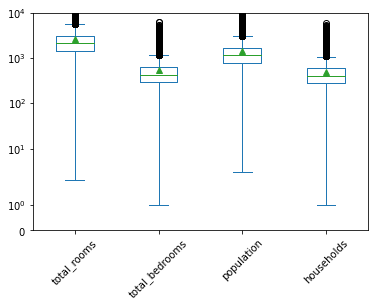

In [43]:
fig, ax = plt.subplots(1,1)

data[['total_rooms', 'total_bedrooms', 'population', 'households']].plot.box(ax=ax, rot=45, showmeans=True)

ax.set_ylim(0, 10000)
ax.set_yscale('symlog')

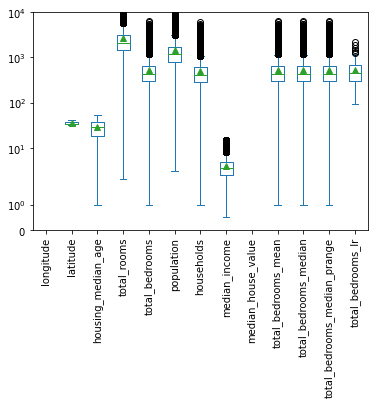

In [44]:
fig, ax = plt.subplots(1,1)

data.plot.box(ax=ax, rot=90, showmeans=True)

ax.set_ylim(0, 10000)
ax.set_yscale('symlog')

ocean_proximity
<1H OCEAN     AxesSubplot(0.125,0.125;0.775x0.755)
INLAND        AxesSubplot(0.125,0.125;0.775x0.755)
ISLAND        AxesSubplot(0.125,0.125;0.775x0.755)
NEAR BAY      AxesSubplot(0.125,0.125;0.775x0.755)
NEAR OCEAN    AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

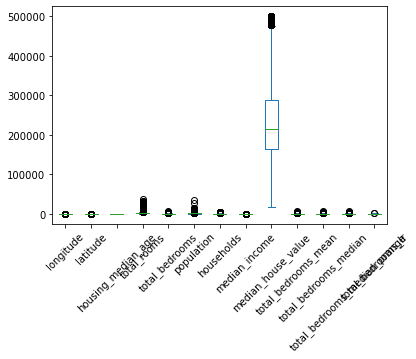

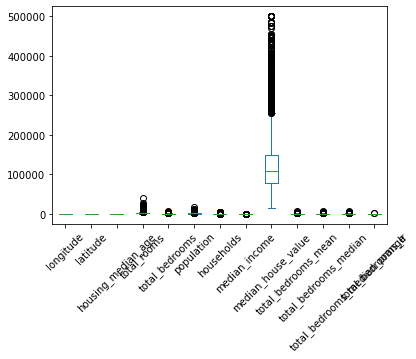

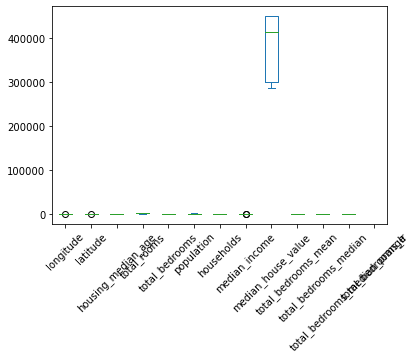

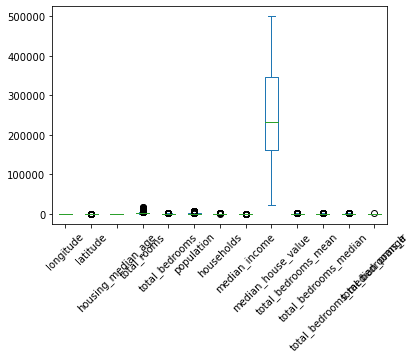

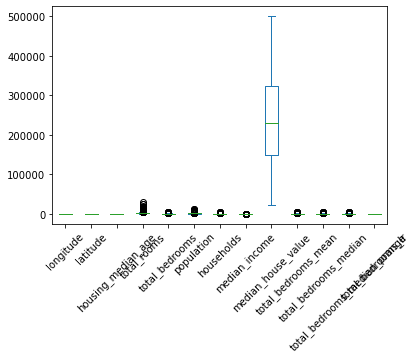

In [45]:
data.groupby(['ocean_proximity']).plot.box(rot=45)

### Outlier Detection (IQR Method - https://online.stat.psu.edu/stat200/lesson/3/3.2 - __IQR = Q75 - Q25__)
  * #### x > Q75 + 1.5 * IQR  
  * #### x < Q25 - 1.5 * IQR

In [46]:
data.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,total_bedrooms_mean,total_bedrooms_median,total_bedrooms_median_prange,total_bedrooms_lr
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,207.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,537.874806,536.852229,536.876357,524.115942
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,419.267716,419.390765,419.393845,320.626126
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,1.000000,1.000000,1.000000,92.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,297.000000,297.000000,297.000000,299.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,438.000000,435.000000,435.000000,451.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,643.250000,643.250000,643.250000,686.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000,6445.000000,6445.000000,6445.000000,2165.000000


In [47]:
def find_outliers_IQR(df, feats):
   q1, q3 = df[feats].quantile(0.25), df[feats].quantile(0.75)
   IQR = q3 - q1

   return df.loc[(
      # np.logical_and.reduce(df[feats] <= (q1 - 1.5 * IQR), axis=1)
      np.logical_or.reduce(df[feats] <= (q1 - 1.5 * IQR), axis=1)
   ) | (
      # np.logical_and.reduce(df[feats] >= (q3 + 1.5 * IQR), axis=1)
      np.logical_or.reduce(df[feats] >= (q3 + 1.5 * IQR), axis=1)
   )]

In [48]:
data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_mean,total_bedrooms_median,median_house_value_range,total_bedrooms_median_prange,total_bedrooms_lr
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,129.0,129.0,"(435334.067, 467667.533]",129.0,NaN
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,1106.0,1106.0,"(338333.667, 370667.133]",1106.0,NaN
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,190.0,190.0,"(338333.667, 370667.133]",190.0,NaN
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,235.0,235.0,"(338333.667, 370667.133]",235.0,NaN
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,280.0,280.0,"(338333.667, 370667.133]",280.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,374.0,374.0,"(47332.467, 79665.933]",374.0,NaN
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,150.0,150.0,"(47332.467, 79665.933]",150.0,NaN
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,485.0,485.0,"(79665.933, 111999.4]",485.0,NaN
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,409.0,409.0,"(79665.933, 111999.4]",409.0,NaN


In [49]:
data.drop(
    find_outliers_IQR(data.copy(), feats=['total_rooms', 'total_bedrooms', 'population', 'households']).index
)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_mean,total_bedrooms_median,median_house_value_range,total_bedrooms_median_prange,total_bedrooms_lr
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,129.0,129.0,"(435334.067, 467667.533]",129.0,NaN
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,190.0,190.0,"(338333.667, 370667.133]",190.0,NaN
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,235.0,235.0,"(338333.667, 370667.133]",235.0,NaN
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,280.0,280.0,"(338333.667, 370667.133]",280.0,NaN
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY,213.0,213.0,"(241333.267, 273666.733]",213.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,374.0,374.0,"(47332.467, 79665.933]",374.0,NaN
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,150.0,150.0,"(47332.467, 79665.933]",150.0,NaN
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,485.0,485.0,"(79665.933, 111999.4]",485.0,NaN
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,409.0,409.0,"(79665.933, 111999.4]",409.0,NaN


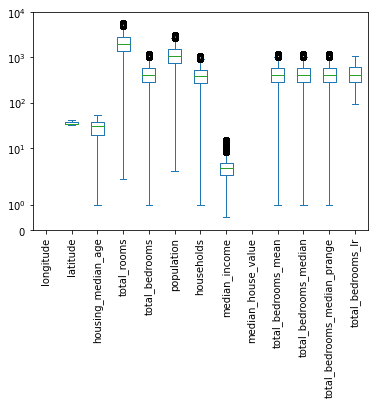

In [50]:
ax = data.drop(
    find_outliers_IQR(data.copy(), feats=['total_rooms', 'total_bedrooms', 'population', 'households']).index
).plot.box(rot=90)

ax.set_ylim(0, 10000)
ax.set_yscale('symlog')

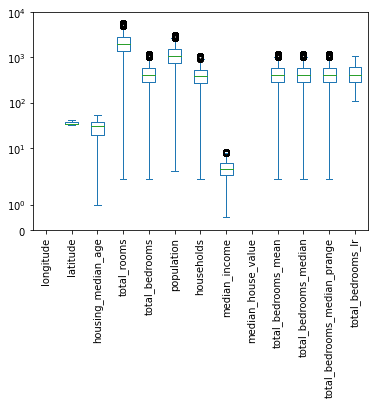

In [51]:
ax = data.drop(
    find_outliers_IQR(data.copy(), feats=['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']).index
).plot.box(rot=90)

ax.set_ylim(0, 10000)
ax.set_yscale('symlog')

In [53]:
data.drop(
    find_outliers_IQR(data.copy(), feats=['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']).index
).astype({'median_house_value_range':str}).drop(['total_bedrooms_lr'], axis=1).to_csv('./data/housing_clean.csv', index=False, header=True)

### Smoothing outliers using Linear Regression (e.g., smoothing ```total_bedrooms``` based on ```total_rooms```)

In [54]:
feat = 'total_bedrooms'

q25, q75 = data.describe()[feat][['25%', '75%']]
iqr = q75 - q25

In [55]:
~data.total_bedrooms.between(q25 - 1.5*iqr, q75 + 1.5*iqr, inclusive='neither')

0        False
1        False
2        False
3        False
4        False
         ...  
20635    False
20636    False
20637    False
20638    False
20639    False
Name: total_bedrooms, Length: 20640, dtype: bool

In [56]:
outliers = data.loc[~data.total_bedrooms.between(q25 - 1.5*iqr, q75 + 1.5*iqr, inclusive='both')].copy()
outliers

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_mean,total_bedrooms_median,median_house_value_range,total_bedrooms_median_prange,total_bedrooms_lr
95,-122.26,37.80,36.0,5329.0,2477.0,3469.0,2323.0,2.0096,130000.0,NEAR BAY,2477.0,2477.0,"(111999.4, 144332.867]",2477.0,NaN
96,-122.26,37.82,31.0,4596.0,1331.0,2048.0,1180.0,2.8345,183800.0,NEAR BAY,1331.0,1331.0,"(176666.333, 208999.8]",1331.0,NaN
98,-122.26,37.82,22.0,3682.0,1270.0,2024.0,1250.0,1.2185,170000.0,NEAR BAY,1270.0,1270.0,"(144332.867, 176666.333]",1270.0,NaN
100,-122.25,37.81,29.0,4656.0,1414.0,2304.0,1250.0,2.4912,257800.0,NEAR BAY,1414.0,1414.0,"(241333.267, 273666.733]",1414.0,NaN
101,-122.25,37.81,28.0,5806.0,1603.0,2563.0,1497.0,3.2177,273400.0,NEAR BAY,1603.0,1603.0,"(241333.267, 273666.733]",1603.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20539,-121.71,38.56,20.0,8627.0,1516.0,4071.0,1466.0,4.2198,164100.0,INLAND,1516.0,1516.0,"(144332.867, 176666.333]",1516.0,NaN
20543,-121.74,38.55,33.0,6861.0,1820.0,3717.0,1767.0,1.7311,182600.0,INLAND,1820.0,1820.0,"(176666.333, 208999.8]",1820.0,NaN
20544,-121.76,38.55,23.0,8800.0,1857.0,6330.0,1832.0,2.0650,219400.0,INLAND,1857.0,1857.0,"(208999.8, 241333.267]",1857.0,NaN
20563,-121.75,38.67,9.0,12139.0,2640.0,6837.0,2358.0,3.1250,132500.0,INLAND,2640.0,2640.0,"(111999.4, 144332.867]",2640.0,NaN


In [57]:
# Smoothing ```total_bedrooms``` feature using Regression based on ```total_rooms```
from sklearn.linear_model import LinearRegression

normal = data.drop(outliers.index, axis=0).copy()
input, target = 'total_rooms', 'total_bedrooms'

lr = LinearRegression()

# Train the model on non-outlier values
X = normal.loc[:, input].values.reshape(-1, 1)
y = normal.loc[:, target].values.reshape(-1, 1)
lr.fit(X,y)

# Fill in the Missing values
pred = lr.predict(data.loc[:, input].values.reshape(-1, 1)).astype(int)
data.loc[:, f'{target}_smooth'] = pred

In [58]:
data.loc[~data[f'{feat}_smooth'].between(q25 - 1.5*iqr, q75 + 1.5*iqr, inclusive='both')].copy()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_mean,total_bedrooms_median,median_house_value_range,total_bedrooms_median_prange,total_bedrooms_lr,total_bedrooms_smooth
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,1106.0,1106.0,"(338333.667, 370667.133]",1106.0,NaN,1273
283,-122.16,37.79,22.0,12842.0,2048.0,4985.0,1967.0,5.9849,371000.0,NEAR BAY,2048.0,2048.0,"(370667.133, 403000.6]",2048.0,NaN,2240
508,-122.30,37.84,14.0,7355.0,2408.0,3100.0,2051.0,4.0018,143800.0,NEAR BAY,2408.0,2408.0,"(111999.4, 144332.867]",2408.0,NaN,1316
568,-122.24,37.73,21.0,7031.0,1249.0,2930.0,1235.0,4.5213,228400.0,NEAR BAY,1249.0,1249.0,"(208999.8, 241333.267]",1249.0,NaN,1262
570,-122.24,37.72,5.0,18634.0,2885.0,7427.0,2718.0,7.6110,350700.0,NEAR BAY,2885.0,2885.0,"(338333.667, 370667.133]",2885.0,NaN,3216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20543,-121.74,38.55,33.0,6861.0,1820.0,3717.0,1767.0,1.7311,182600.0,INLAND,1820.0,1820.0,"(176666.333, 208999.8]",1820.0,NaN,1233
20544,-121.76,38.55,23.0,8800.0,1857.0,6330.0,1832.0,2.0650,219400.0,INLAND,1857.0,1857.0,"(208999.8, 241333.267]",1857.0,NaN,1560
20563,-121.75,38.67,9.0,12139.0,2640.0,6837.0,2358.0,3.1250,132500.0,INLAND,2640.0,2640.0,"(111999.4, 144332.867]",2640.0,NaN,2122
20567,-121.79,38.66,15.0,6809.0,1052.0,3060.0,1060.0,5.3064,165000.0,INLAND,1052.0,1052.0,"(144332.867, 176666.333]",1052.0,NaN,1224


In [59]:
### ALTERNATIVE: Discover and Drop Outliers using Clustering (e.g. DBSCAN)